In [1]:
from collections import defaultdict
import os
from pprint import pprint
from time import time
from IPython.display import HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = [16, 8]
import seaborn as sns
sns.set_theme(style="darkgrid")
import plotly.express as px
px.set_mapbox_access_token(os.environ['MAPBOX_TOKEN'])

# db
from sqlalchemy import create_engine
import geoalchemy2
from pymongo import MongoClient, GEOSPHERE
from pymongo.database import Database
from bson.son import SON

# geo
import geojson
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point, Polygon, MultiPolygon
from shapely.geometry.linestring import LineString
from keplergl import KeplerGl

# Note

## How to create spatial index


```sql
CREATE INDEX some_descriptive_idx_name
ON table_name
USING GIST (geometry);
```

Note:

The `USING GIST` clause tells PostgreSQL to use the generic index structure (GIST) when building the index. If you receive an error that looks like ERROR: index row requires 11340 bytes, maximum size is 8191 when creating your index, you have likely neglected to add the USING GIST clause.

# Import data

## Import OpenStreetMap

In [2]:
# Creating SQLAlchemy's engine to use
username = 'Kai'
password = ''
host = 'localhost'
port = '5432'
database_name = 'test'

engine = create_engine(f'postgresql://{username}:{password}@{host}:{port}/{database_name}')

In [3]:
# # read data into geodataframe and load to database
# path = 'data/australia-latest-free.shp'

# for file in os.listdir(path):
#     fn, ext = os.path.splitext(file)
    
#     if ext == '.shp':
#         table_name = fn.split('_')[2]
#         df = gpd.read_file(os.path.join(path, file))
#         df['geometry'] = df['geometry'].apply(lambda x: WKTElement(x.wkt, srid=4326))
        
#         try:
#             df.to_sql(table_name, engine, if_exists='replace', index=False, dtype={'geometry': Geometry})
#             df.to_postgis(table_name, engine, if_exists='replace')
#             print(f"imported: {table_name:>14}")
#         except:
#             print(f"failed: {table_name:>14}")

In [4]:
%%time 
# read data into geodataframe and load to database
path = 'data/australia-latest-free.shp'

for file in os.listdir(path):
    fn, ext = os.path.splitext(file)
    
    if ext == '.shp':
        table_name = fn.split('_')[2]

        df = gpd.read_file(os.path.join(path, file))
        df.columns = [col.lower() for col in df.columns]
        
        try:
            df.to_postgis(table_name, engine, if_exists='replace')
            print(f"imported: {table_name:>14}")
        except:
            print(f"failed: {table_name:>14}")

imported:        landuse
failed:        natural
imported:      buildings
imported:      waterways
imported:           pofw
imported:          water
imported:      transport
imported:         places
failed:        natural
imported:         places
imported:           pofw
imported:           pois
imported:        traffic
imported:        traffic
imported:       railways
imported:      transport
imported:           pois
imported:          roads
CPU times: user 7min 45s, sys: 35.7 s, total: 8min 21s
Wall time: 11min


In [5]:
!psql -U Kai -d test -c "\d+"

                          List of relations
 Schema |        Name        | Type  | Owner |   Size   | Description 
--------+--------------------+-------+-------+----------+-------------
 public | airbnb             | table | Kai   | 153 MB   | 
 public | airbnb_sydney_100  | table | Kai   | 160 kB   | 
 public | airbnb_sydney_100k | table | Kai   | 145 MB   | 
 public | airbnb_sydney_10k  | table | Kai   | 14 MB    | 
 public | airbnb_sydney_1k   | table | Kai   | 1480 kB  | 
 public | airbnb_sydney_1m   | table | Kai   | 1445 MB  | 
 public | airbnb_sydney_500k | table | Kai   | 723 MB   | 
 public | buildings          | table | Kai   | 353 MB   | 
 public | districts          | table | Kai   | 92 MB    | 
 public | geography_columns  | view  | Kai   | 0 bytes  | 
 public | geometry_columns   | view  | Kai   | 0 bytes  | 
 public | landuse            | table | Kai   | 215 MB   | 
 public | natural            | table | Kai   | 4088 kB  | 
 public | places             | table | Kai   | 

## Import districts

In [6]:
gpd.read_file('data/australia-latest-free.shp/gis_osm_buildings_a_free_1.shp', rows=100).crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
districts = gpd.read_file('data/nsw_locality_polygon_shp/NSW_LOCALITY_POLYGON_shp.shp')
districts.columns = [col.lower() for col in districts.columns]
districts.crs

<Geographic 2D CRS: EPSG:4283>
Name: GDA94
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Australia - GDA
- bounds: (93.41, -60.56, 173.35, -8.47)
Datum: Geocentric Datum of Australia 1994
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [8]:
districts.to_crs(epsg=4326, inplace=True)
districts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [9]:
districts.to_postgis('districts', engine, if_exists='replace')

<AxesSubplot:>

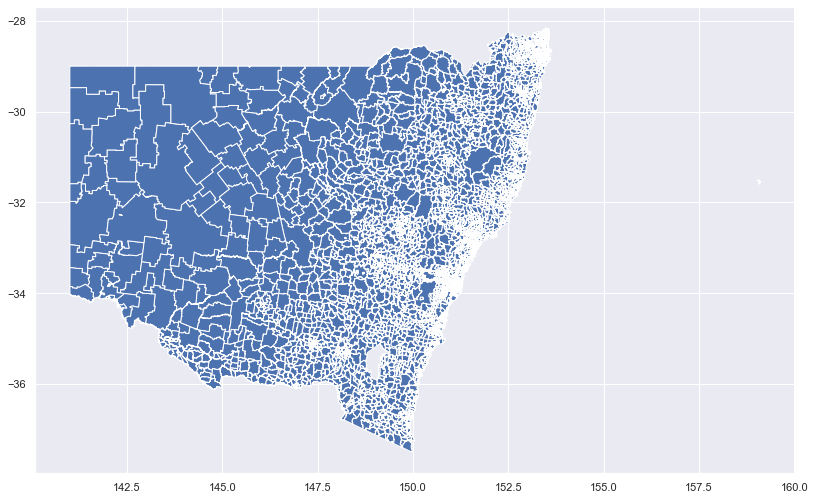

In [10]:
districts.plot()

In [11]:
districts.shape

(4591, 13)

In [12]:
!psql -U Kai -d test -c "\d districts"

                       Table "public.districts"
   Column   |          Type          | Collation | Nullable | Default 
------------+------------------------+-----------+----------+---------
 lc_ply_pid | text                   |           |          | 
 dt_create  | text                   |           |          | 
 dt_retire  | text                   |           |          | 
 loc_pid    | text                   |           |          | 
 nsw_locali | text                   |           |          | 
 nsw_loca_1 | text                   |           |          | 
 nsw_loca_2 | text                   |           |          | 
 nsw_loca_3 | text                   |           |          | 
 nsw_loca_4 | text                   |           |          | 
 nsw_loca_5 | text                   |           |          | 
 nsw_loca_6 | text                   |           |          | 
 nsw_loca_7 | text                   |           |          | 

Indexes:
    "idx_districts_geometry" gist (geometry)

## Import airbnb

In [13]:
df = pd.read_csv('data/airbnb/listings_dec18.csv')
print(df.shape)
df.head()

/Users/Kai/anaconda3/envs/geo/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3147: DtypeWarning: Columns (43,61,62,87) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(36662, 96)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",...,f,NaN,NaN,f,f,strict_14_with_grace_period,t,t,2,4.83
1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,...,f,NaN,NaN,f,f,strict_14_with_grace_period,f,f,2,0.03
2,15253,https://www.airbnb.com/rooms/15253,20181207034750,2018-12-07,Stunning Penthouse Apartment In Heart Of The City,Penthouse living in a great central location: ...,"A charming two-level, two-bedroom, two-bathroo...",Penthouse living in a great central location: ...,none,The location is really central and there is nu...,...,f,NaN,NaN,t,f,strict_14_with_grace_period,f,f,2,3.63
3,20865,https://www.airbnb.com/rooms/20865,20181207034750,2018-12-07,3 BED HOUSE + 1 BED STUDIO Balmain,Hi! We are a married professional couple with ...,HOUSE : _________ * DUCTED AIR CONDITIONING IN...,Hi! We are a married professional couple with ...,none,BALMAIN is an older inner city village / subur...,...,f,NaN,NaN,f,f,strict_14_with_grace_period,t,t,1,0.18
4,26174,https://www.airbnb.com/rooms/26174,20181207034750,2018-12-07,"COZY PRIVATE ROOM, GREAT LOCATION!",NaN,"Double bed in decent sized bedroom, in two bed...","Double bed in decent sized bedroom, in two bed...",none,NaN,...,f,NaN,NaN,f,f,moderate,f,f,1,0.45


In [14]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms',

In [15]:
cols = ['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet',
       'price', 'weekly_price', 'monthly_price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights',
       'maximum_nights', 'calendar_updated', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped', 'number_of_reviews',
       'first_review', 'last_review', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'requires_license',
       'license', 'jurisdiction_names', 'instant_bookable',
       'is_business_travel_ready', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification',
       'calculated_host_listings_count', 'reviews_per_month']

In [16]:
df['geometry'] = [Point(x, y) for x, y in zip(df.longitude, df.latitude)]

In [17]:
gdf = gpd.GeoDataFrame(df, geometry='geometry')
gdf = gdf.set_crs(epsg=4326)

Check that data and geospatial attributes are correct w.r.t. coordinate system used

<AxesSubplot:>

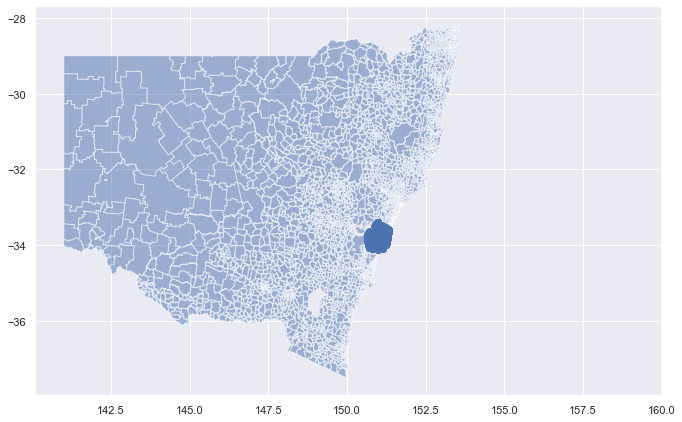

In [18]:
fig, ax = plt.subplots(figsize=(10, 10))
districts.plot(ax=ax, alpha=0.5)
gdf.plot(ax=ax)

In [19]:
px.scatter_mapbox(gdf, lat='latitude', lon='longitude', color='neighbourhood_cleansed')

In [20]:
gdf.to_postgis('airbnb', engine, if_exists='replace')

# Check data & test that spatial queries work

In [21]:
df = gpd.read_postgis("SELECT * FROM districts WHERE nsw_loca_2 = 'CHIPPENDALE'", engine, geom_col='geometry')
df

,lc_ply_pid,dt_create,dt_retire,loc_pid,nsw_locali,nsw_loca_1,nsw_loca_2,nsw_loca_3,nsw_loca_4,nsw_loca_5,nsw_loca_6,nsw_loca_7,geometry
0,24239,2015-02-24,None,NSW921,2015-05-08,None,CHIPPENDALE,None,None,G,None,1,"POLYGON ((151.19334 -33.88784, 151.19317 -33.8..."


In [22]:
!psql -d test -c "SELECT ST_Area(geometry, true) FROM districts WHERE nsw_loca_2 = 'NEWTOWN';"

      st_area      
-------------------
 1586153.340185988
(1 row)



In [23]:
cursor = engine.execute("SELECT ST_Area(geometry, true) FROM districts WHERE nsw_loca_2 = 'NEWTOWN';")
cursor.fetchall()

[(1586153.340185988,)]

In [24]:
sql = """
SELECT roads.* 
FROM roads, districts
WHERE districts.nsw_loca_2 = 'CHIPPENDALE' 
    AND ST_Intersects(districts.geometry, roads.geometry);
"""

In [25]:
%%time
roads = gpd.read_postgis(sql, engine, geom_col='geometry')
roads

CPU times: user 33 ms, sys: 5.54 ms, total: 38.6 ms
Wall time: 74.4 ms


,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,46940608,5122,residential,Rose Street,None,B,40,0,F,F,"LINESTRING (151.19436 -33.88800, 151.19439 -33..."
1,173486845,5141,service,McAlister Lane,None,B,40,0,F,F,"LINESTRING (151.19918 -33.88739, 151.19919 -33..."
2,183111044,5141,service,None,None,B,0,0,F,F,"LINESTRING (151.20648 -33.88545, 151.20641 -33..."
3,318667959,5155,steps,None,None,B,0,0,F,F,"LINESTRING (151.20054 -33.88544, 151.20054 -33..."
4,411017203,5122,residential,None,None,B,0,0,F,F,"LINESTRING (151.19738 -33.88444, 151.19738 -33..."
...,...,...,...,...,...,...,...,...,...,...,...
301,514985726,5153,footway,None,None,B,0,0,F,F,"LINESTRING (151.19872 -33.88741, 151.19872 -33..."
302,625461200,5141,service,Sydney Yard Access Bridge,None,B,20,1,T,F,"LINESTRING (151.20196 -33.88753, 151.20211 -33..."
303,652573453,5153,footway,None,None,B,0,0,F,F,"LINESTRING (151.20152 -33.88546, 151.20181 -33..."
304,1954876,5113,primary,Cleveland Street,None,F,50,0,F,F,"LINESTRING (151.19310 -33.88761, 151.19325 -33..."


In [26]:
df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
roads.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

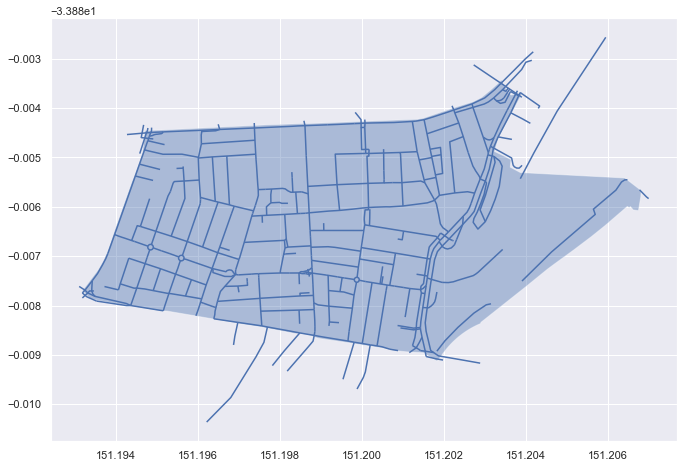

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))
ax = df.plot(alpha=0.4, ax=ax)
roads.plot(ax=ax)

In [29]:
cursor = engine.execute("SELECT COUNT(*) FROM roads")
cursor.fetchall()

[(1905150,)]

In [30]:
cursor = engine.execute("SELECT COUNT(*) FROM districts")
cursor.fetchall()

[(4591,)]

In [31]:
%%time
sql = """
SELECT districts.nsw_loca_2 AS area, roads.*
FROM districts
JOIN roads ON ST_Intersects(districts.geometry, roads.geometry);
"""

roads = gpd.read_postgis(sql, engine, geom_col='geometry')
roads

CPU times: user 13 s, sys: 1.69 s, total: 14.7 s
Wall time: 2min 12s


,area,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,CAMPSIE,1881386,5122,residential,Anglo Road,None,F,50,0,F,F,"LINESTRING (151.09789 -33.91319, 151.09910 -33..."
1,CAMPSIE,1881388,5122,residential,Loch Street,None,B,50,0,F,F,"LINESTRING (151.09770 -33.91285, 151.09775 -33..."
2,CAMPSIE,1881389,5115,tertiary,Evaline Street,None,B,50,0,F,F,"LINESTRING (151.09782 -33.91558, 151.09783 -33..."
3,GYMEA,1881520,5115,tertiary,Clements Parade,None,B,0,0,F,F,"LINESTRING (151.08040 -34.03458, 151.08030 -34..."
4,KIRRAWEE,1881520,5115,tertiary,Clements Parade,None,B,0,0,F,F,"LINESTRING (151.08040 -34.03458, 151.08030 -34..."
...,...,...,...,...,...,...,...,...,...,...,...,...
518483,KATOOMBA,865498461,5153,footway,None,None,B,0,0,F,F,"LINESTRING (150.31060 -33.71498, 150.31061 -33..."
518484,KATOOMBA,865498462,5153,footway,None,None,B,0,0,F,F,"LINESTRING (150.31061 -33.71491, 150.31063 -33..."
518485,KATOOMBA,865498463,5153,footway,None,None,B,0,0,F,F,"LINESTRING (150.31069 -33.71476, 150.31068 -33..."
518486,KATOOMBA,865498464,5153,footway,None,None,B,0,0,F,F,"LINESTRING (150.31068 -33.71463, 150.31066 -33..."


## Test query: filter roads / airbnb data

In [32]:
%%time
sql = """
SELECT *
FROM districts
WHERE nsw_loca_2 = 'CHIPPENDALE'
"""

sydney = gpd.read_postgis(sql, engine, geom_col='geometry')
sydney

CPU times: user 22 ms, sys: 1.84 ms, total: 23.9 ms
Wall time: 30.4 ms


,lc_ply_pid,dt_create,dt_retire,loc_pid,nsw_locali,nsw_loca_1,nsw_loca_2,nsw_loca_3,nsw_loca_4,nsw_loca_5,nsw_loca_6,nsw_loca_7,geometry
0,24239,2015-02-24,None,NSW921,2015-05-08,None,CHIPPENDALE,None,None,G,None,1,"POLYGON ((151.19334 -33.88784, 151.19317 -33.8..."


In [33]:
%%time
sql = """SELECT * FROM airbnb"""
listings = gpd.read_postgis(sql, engine, geom_col='geometry')
listings

CPU times: user 2.29 s, sys: 233 ms, total: 2.52 s
Wall time: 3.29 s


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,geometry
0,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,"Pyrmont is an inner-city village of Sydney, on...",...,None,None,f,f,strict_14_with_grace_period,t,t,2,4.83,POINT (151.19190 -33.86515)
1,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,Balgowlah Heights is one of the most prestigio...,...,None,None,f,f,strict_14_with_grace_period,f,f,2,0.03,POINT (151.26172 -33.80093)
2,15253,https://www.airbnb.com/rooms/15253,20181207034750,2018-12-07,Stunning Penthouse Apartment In Heart Of The City,Penthouse living in a great central location: ...,"A charming two-level, two-bedroom, two-bathroo...",Penthouse living in a great central location: ...,none,The location is really central and there is nu...,...,None,None,t,f,strict_14_with_grace_period,f,f,2,3.63,POINT (151.21654 -33.88045)
3,20865,https://www.airbnb.com/rooms/20865,20181207034750,2018-12-07,3 BED HOUSE + 1 BED STUDIO Balmain,Hi! We are a married professional couple with ...,HOUSE : _________ * DUCTED AIR CONDITIONING IN...,Hi! We are a married professional couple with ...,none,BALMAIN is an older inner city village / subur...,...,None,None,f,f,strict_14_with_grace_period,t,t,1,0.18,POINT (151.17275 -33.85907)
4,26174,https://www.airbnb.com/rooms/26174,20181207034750,2018-12-07,"COZY PRIVATE ROOM, GREAT LOCATION!",None,"Double bed in decent sized bedroom, in two bed...","Double bed in decent sized bedroom, in two bed...",none,None,...,None,None,f,f,moderate,f,f,1,0.45,POINT (151.25940 -33.88909)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36657,30592081,https://www.airbnb.com/rooms/30592081,20181207034750,2018-12-07,The top floor paradise,This top floor paradise offers a very bright a...,None,This top floor paradise offers a very bright a...,none,None,...,None,None,t,f,flexible,f,f,1,NaN,POINT (151.25938 -33.87494)
36658,30592161,https://www.airbnb.com/rooms/30592161,20181207034750,2018-12-07,Sydney harbour catamaran sailing. Parties for 10,Organise your function/party for 10 people on ...,The catamaran is spacious and ideal for functi...,Organise your function/party for 10 people on ...,none,Experience Sydney harbour in a spectacular and...,...,None,None,f,f,flexible,f,f,1,NaN,POINT (151.14957 -33.84784)
36659,30592248,https://www.airbnb.com/rooms/30592248,20181207034750,2018-12-07,Double Room built-in a large and bright apartment,New Double Room with light filled interiors id...,8 min from Homebush train Station 3 min from B...,New Double Room with light filled interiors id...,none,None,...,None,None,t,f,flexible,f,f,1,NaN,POINT (151.08172 -33.86372)
36660,30592505,https://www.airbnb.com/rooms/30592505,20181207034750,2018-12-07,Bright Modern apartment in a Premiere location,"Generous space with 2 bed rooms ,2 bathrooms ,...",2 bed rooms both with a Queen size bed . one w...,"Generous space with 2 bed rooms ,2 bathrooms ,...",none,3-5 Min Walk for Train Station / Cafe/ Restaur...,...,None,None,t,f,strict_14_with_grace_period,f,f,1,NaN,POINT (151.15066 -33.92996)


In [34]:
listings.to_crs(epsg=3857, inplace=True)
roads.to_crs(epsg=3857, inplace=True)
sydney.to_crs(epsg=3857, inplace=True)
sydney.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [35]:
sydney.geometry[0].area

674791.8687212318

10km radius

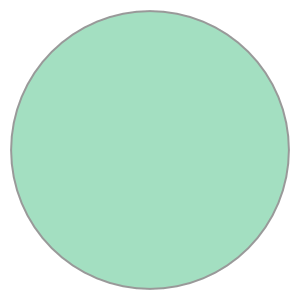

In [36]:
sydney['geometry'] = sydney.geometry[0].centroid.buffer(10000)
sydney['geometry'][0]

**Filter roads to Sydney (approximate)**

In [37]:
print(roads.shape)
sydney_roads = roads[roads['geometry'].intersects(sydney['geometry'][0])].copy()
print(sydney_roads.shape)

(518488, 12)
(36714, 12)


<AxesSubplot:>

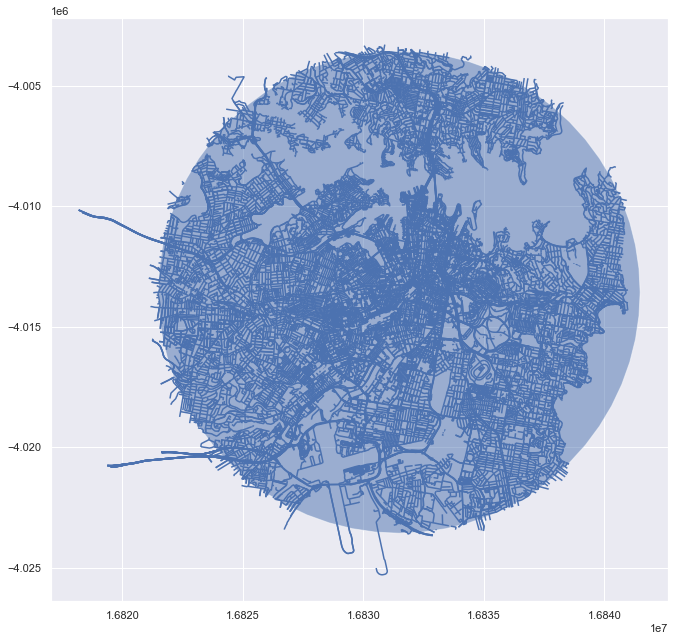

In [38]:
fig, ax = plt.subplots(figsize=(10, 10))
sydney.plot(ax=ax, alpha=0.5)
sydney_roads.plot(ax=ax)

In [39]:
crs = sydney.crs
sydney_roads.crs = crs

**Filter Airbnb listings to Sydney (approximate)**

In [40]:
print(listings.shape)
sydney_listings = listings[listings['geometry'].intersects(sydney['geometry'][0])].copy()
print(sydney_listings.shape)

(36662, 97)
(25088, 97)


<AxesSubplot:>

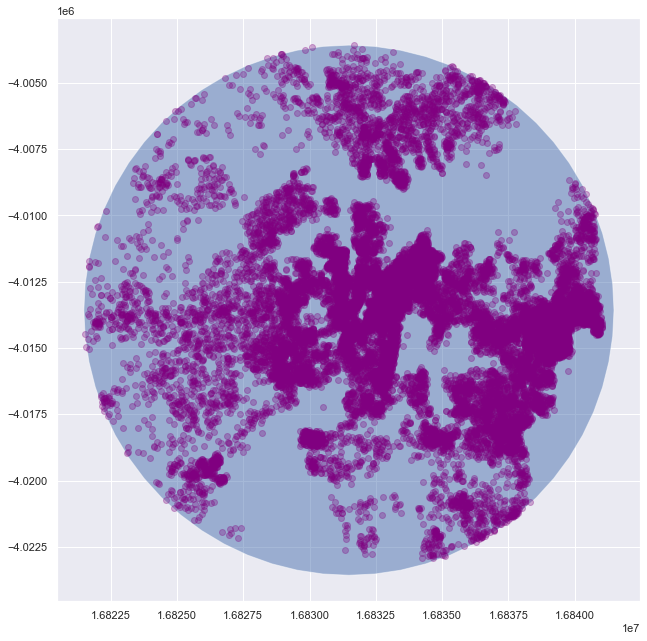

In [41]:
fig, ax = plt.subplots(figsize=(10, 10))
sydney.plot(ax=ax, alpha=0.5)
sydney_listings.plot(ax=ax, alpha=0.3, color='purple')

In [42]:
crs = sydney.crs
sydney_listings.crs = crs

**make sure all coordinate systems are consistent**

<AxesSubplot:>

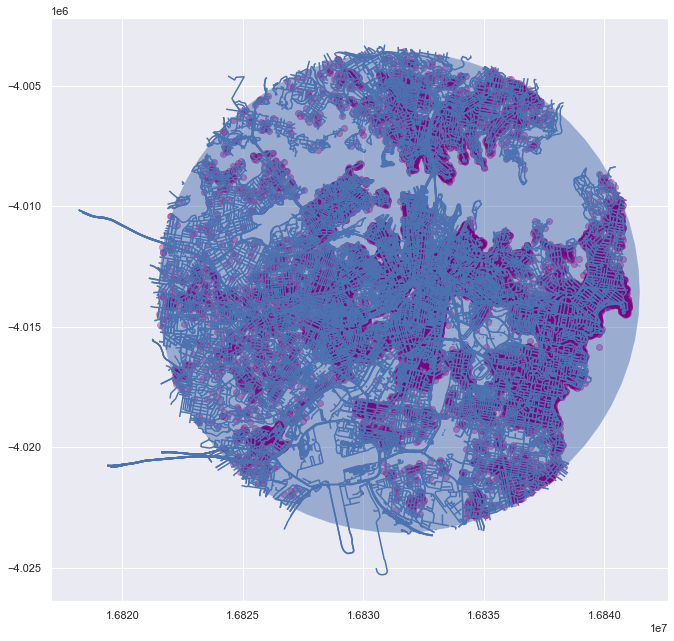

In [43]:
fig, ax = plt.subplots(figsize=(10, 10))
sydney.plot(ax=ax, alpha=0.5)
sydney_roads.plot(ax=ax)
sydney_listings.plot(ax=ax, alpha=0.3, color='purple')

**save**

In [44]:
sydney_roads.to_crs(epsg=4326, inplace=True)
sydney_roads.drop('area', 1).to_postgis('roads_sydney', engine, if_exists='replace')

In [45]:
sydney_listings.to_crs(epsg=4326, inplace=True)
sydney_listings.to_postgis('airbnb_sydney', engine, if_exists='replace')

**undo**

In [46]:
engine.execute("DROP TABLE roads_sydney;")
engine.execute("DROP TABLE airbnb_sydney;")

# Create test data and load to PostGIS, and save as geojson

In [47]:
def save_gdf_as_geojson(df, path):
    js = df.to_json()
    js = geojson.loads(js)
    
    with open(path, 'w') as f:
        geojson.dump(js, f)

## Create test roads data

In [48]:
%%time
sql = """
SELECT districts.nsw_loca_2 AS area, roads.*
FROM districts
JOIN roads ON ST_Intersects(districts.geometry, roads.geometry);
"""

roads = gpd.read_postgis(sql, engine, geom_col='geometry')
print(roads.shape)
roads.head()

(518488, 12)
CPU times: user 12.9 s, sys: 891 ms, total: 13.8 s
Wall time: 26.1 s


,area,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,MAYFIELD WEST,574897136,5112,trunk,Maitland Road,A43,F,80,0,F,F,"LINESTRING (151.71879 -32.88202, 151.71875 -32..."
1,MAYFIELD WEST,603148932,5141,service,None,None,B,0,0,F,F,"LINESTRING (151.72985 -32.88293, 151.73005 -32..."
2,MAYFIELD WEST,676662522,5113,primary,Tourle Street,B63,F,80,0,F,F,"LINESTRING (151.73265 -32.88195, 151.73270 -32..."
3,MAYFIELD WEST,710230358,5113,primary,Tourle Street,B63,F,60,0,F,F,"LINESTRING (151.73209 -32.88605, 151.73212 -32..."
4,MAYFIELD WEST,710230371,5113,primary,Maitland Road,None,F,60,0,F,F,"LINESTRING (151.72049 -32.88666, 151.72030 -32..."


518k roads in NSW

In [49]:
roads.to_postgis('sydney_roads', engine, if_exists='replace')

In [50]:
test_set_sizes = [100, 1000, 10000, 100000, 500000]

for n in test_set_sizes:
    n_str = str(n)
        
    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
    
    table_name = 'roads_sydney_' + n_str
    sampled_df = roads.sample(n)
    sampled_df.to_postgis(table_name, engine, if_exists='replace')
    save_gdf_as_geojson(sampled_df, f'data/{table_name}.geojson')

    print(f'roads_sydney_{n_str} exported')

roads_sydney_100 exported
roads_sydney_1k exported
roads_sydney_10k exported
roads_sydney_100k exported
roads_sydney_500k exported


## Create test listings data

In [51]:
%%time
sql = """
SELECT districts.nsw_loca_2 AS area, airbnb.*
FROM districts
JOIN airbnb ON ST_Within(airbnb.geometry, districts.geometry);
"""

listings = gpd.read_postgis(sql, engine, geom_col='geometry')
print(listings.shape)
listings.head()

(36646, 98)
CPU times: user 2.1 s, sys: 287 ms, total: 2.38 s
Wall time: 3.87 s


,area,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,...,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,geometry
0,PYRMONT,12351,https://www.airbnb.com/rooms/12351,20181207034750,2018-12-07,Sydney City & Harbour at the door,Come stay with Vinh & Stuart (Awarded as one o...,"We're pretty relaxed hosts, and we fully appre...",Come stay with Vinh & Stuart (Awarded as one o...,none,...,None,None,f,f,strict_14_with_grace_period,t,t,2,4.83,POINT (151.19190 -33.86515)
1,BALGOWLAH,14250,https://www.airbnb.com/rooms/14250,20181207034750,2018-12-07,Manly Harbour House,"Beautifully renovated, spacious and quiet, our...",Our home is a thirty minute walk along the sea...,"Beautifully renovated, spacious and quiet, our...",none,...,None,None,f,f,strict_14_with_grace_period,f,f,2,0.03,POINT (151.26172 -33.80093)
2,DARLINGHURST,15253,https://www.airbnb.com/rooms/15253,20181207034750,2018-12-07,Stunning Penthouse Apartment In Heart Of The City,Penthouse living in a great central location: ...,"A charming two-level, two-bedroom, two-bathroo...",Penthouse living in a great central location: ...,none,...,None,None,t,f,strict_14_with_grace_period,f,f,2,3.63,POINT (151.21654 -33.88045)
3,BALMAIN,20865,https://www.airbnb.com/rooms/20865,20181207034750,2018-12-07,3 BED HOUSE + 1 BED STUDIO Balmain,Hi! We are a married professional couple with ...,HOUSE : _________ * DUCTED AIR CONDITIONING IN...,Hi! We are a married professional couple with ...,none,...,None,None,f,f,strict_14_with_grace_period,t,t,1,0.18,POINT (151.17275 -33.85907)
4,BELLEVUE HILL,26174,https://www.airbnb.com/rooms/26174,20181207034750,2018-12-07,"COZY PRIVATE ROOM, GREAT LOCATION!",None,"Double bed in decent sized bedroom, in two bed...","Double bed in decent sized bedroom, in two bed...",none,...,None,None,f,f,moderate,f,f,1,0.45,POINT (151.25940 -33.88909)


In [52]:
listings[['latitude', 'longitude']].describe()

,latitude,longitude
count,36646.000000,36646.000000
mean,-33.863124,151.204240
std,0.071509,0.083528
min,-34.135212,150.642903
25%,-33.898448,151.179670
50%,-33.882491,151.215903
75%,-33.832122,151.261385
max,-33.389728,151.339811


In [53]:
listings_1m = listings.copy()
n = 1000000
while len(listings_1m) < n:
    print(len(listings_1m))
    listings2 = listings_1m.copy()
    listings2.latitude = listings2.latitude + np.random.normal(0, 0.001, size=len(listings2))
    listings2.longitude = listings2.longitude + np.random.normal(0, 0.001, size=len(listings2))
    listings2['geometry'] = [Point(x, y) for x, y in zip(listings2.longitude, listings2.latitude)]
    listings_1m = pd.concat([listings_1m, listings2])

listings_1m.shape

36646
73292
146584
293168
586336


(1172672, 98)

In [54]:
cols = ['id', 'listing_url', 'name', 'room_type', 'property_type', 
        'summary', 'description', 'host_id',  'host_name', 'host_since',
        'street', 'neighbourhood_cleansed', 'area', 
        'price', 'number_of_reviews','review_scores_rating',
        'latitude', 'longitude', 'geometry']
listings_1m = listings_1m[cols]

In [55]:
listings_1m.reset_index(drop=True, inplace=True)

In [56]:
test_set_sizes = [100, 1000, 10000, 100000, 500000]

for n in test_set_sizes:
    n_str = str(n)
        
    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
    
    table_name = 'airbnb_sydney_' + n_str
    sampled_df = listings_1m.sample(n)
    sampled_df.to_postgis(table_name, engine, if_exists='replace')
    save_gdf_as_geojson(sampled_df, f'data/{table_name}.geojson')

    print(f'airbnb_sydney_{n_str} exported')

airbnb_sydney_100 exported
airbnb_sydney_1k exported
airbnb_sydney_10k exported
airbnb_sydney_100k exported
airbnb_sydney_500k exported


## Check results

In [57]:
!psql -U Kai -d test -c "\d+"

                          List of relations
 Schema |        Name        | Type  | Owner |   Size   | Description 
--------+--------------------+-------+-------+----------+-------------
 public | airbnb             | table | Kai   | 153 MB   | 
 public | airbnb_sydney_100  | table | Kai   | 176 kB   | 
 public | airbnb_sydney_100k | table | Kai   | 145 MB   | 
 public | airbnb_sydney_10k  | table | Kai   | 14 MB    | 
 public | airbnb_sydney_1k   | table | Kai   | 1504 kB  | 
 public | airbnb_sydney_1m   | table | Kai   | 1445 MB  | 
 public | airbnb_sydney_500k | table | Kai   | 722 MB   | 
 public | buildings          | table | Kai   | 353 MB   | 
 public | districts          | table | Kai   | 92 MB    | 
 public | geography_columns  | view  | Kai   | 0 bytes  | 
 public | geometry_columns   | view  | Kai   | 0 bytes  | 
 public | landuse            | table | Kai   | 215 MB   | 
 public | natural            | table | Kai   | 4088 kB  | 
 public | places             | table | Kai   | 

In [58]:
!ls -lh 'data' | grep geojson

-rw-r--r--@  1 Kai  staff    69M Nov  3 17:20 airbnb_sydney.geojson
-rw-r--r--@  1 Kai  staff   171K Nov 14 15:28 airbnb_sydney_100.geojson
-rw-r--r--@  1 Kai  staff   166M Nov 14 15:29 airbnb_sydney_100k.geojson
-rw-r--r--@  1 Kai  staff    17M Nov 14 15:28 airbnb_sydney_10k.geojson
-rw-r--r--@  1 Kai  staff   1.7M Nov 14 15:28 airbnb_sydney_1k.geojson
-rw-r--r--@  1 Kai  staff   1.6G Nov  8 23:49 airbnb_sydney_1m.geojson
-rw-r--r--@  1 Kai  staff   832M Nov 14 15:31 airbnb_sydney_500k.geojson
-rw-r--r--@  1 Kai  staff   653K Nov  3 17:20 districts.geojson
-rw-r--r--@  1 Kai  staff    49K Nov 10 15:59 nsw_single_shape.geojson
-rw-r--r--@  1 Kai  staff   7.6M Nov  3 17:20 roads_sydney.geojson
-rw-r--r--@  1 Kai  staff    67K Nov 14 15:25 roads_sydney_100.geojson
-rw-r--r--@  1 Kai  staff    64M Nov 14 15:25 roads_sydney_100k.geojson
-rw-r--r--@  1 Kai  staff   6.4M Nov 14 15:25 roads_sydney_10k.geojson
-rw-r--r--@  1 Kai  staff   657K Nov 14 15:25 roads_sydney_1k.geojson
-rw-r--r--@  1

# MongoDB

## Insert data

In [59]:
def bulk_insert(db: Database, collection_name: str, file_path: str):
    if collection_name in db.list_collection_names():
        db.drop_collection(collection_name)
        
    db.create_collection(collection_name)
    collection = db[collection_name]
    
    # create 2dsphere index
    collection.create_index([("geometry", GEOSPHERE)])
    
    assert os.path.exists(file_path), 'file does not exist'
    
    with open(file_path, 'r') as f:
        js = geojson.load(f)
        
    n_features = len(js['features'])
        
    for feature in js['features']:
        collection.insert_one(feature)
        
    assert collection.count_documents({}) == n_features, 'import failed'

In [60]:
client = MongoClient('mongodb://localhost:27017/')

In [61]:
if 'test' in client.list_database_names():
    client.drop_database('test')

In [62]:
client.list_database_names()

['a1', 'admin', 'config', 'local']

In [63]:
db = client['test']

In [64]:
assert len(db.list_collection_names()) == 0

In [65]:
data = 'airbnb'
for n in ['100', '1k', '10k', '100k', '1m']:
    name = f'{data}_sydney_{n}'
    bulk_insert(db, name, f'data/{name}.geojson')
    print(name, 'loaded')
        
data = 'roads'
for n in ['100', '1k', '10k', '100k', '500k']:
    name = f'{data}_sydney_{n}'
    bulk_insert(db, name, f'data/{name}.geojson')
    print(name, 'loaded')

airbnb_sydney_100 loaded
airbnb_sydney_1k loaded
airbnb_sydney_10k loaded
airbnb_sydney_100k loaded
airbnb_sydney_1m loaded
roads_sydney_100 loaded
roads_sydney_1k loaded
roads_sydney_10k loaded
roads_sydney_100k loaded
roads_sydney_500k loaded


In [66]:
bulk_insert(db, 'districts', 'data/districts.geojson')

In [67]:
db.list_collection_names()

['roads_sydney_1k',
 'roads_sydney_100k',
 'airbnb_sydney_10k',
 'roads_sydney_10k',
 'airbnb_sydney_100k',
 'airbnb_sydney_1k',
 'roads_sydney_500k',
 'roads_sydney_100',
 'airbnb_sydney_1m',
 'airbnb_sydney_100',
 'districts']

## Test Geospatial operators

### `$nearSphere`

In [68]:
sample = db.airbnb_sydney_1m.find_one({})
print(sample['geometry'])

{'type': 'Point', 'coordinates': [151.093007, -33.765708]}


In [69]:
# should return the same airbnb listing
result = db.airbnb_sydney_1m.find({"geometry": {"$nearSphere": sample['geometry']['coordinates']}}).limit(1)
result = [item for item in result]
result[0]['_id'] == sample['_id']

True

`$nearSphere` + `$maxDistance`, `$centerSphere`

https://www.latlong.net/place/sydney-opera-house-australia-3894.html

<img src='img/opera.png' width=800 height=200>

In [70]:
def distance_to_radians(km):
    """ convert distance (in km) to radians as required by all spherical spatial operators in Mongo """
    return km / 6378.137

# opera house coordinates
lat = -33.856159
lon = 151.215256
point = [lon, lat]
max_dist = 5 # in km

In [71]:
db.airbnb_sydney_1m.count_documents({})

1000000

In [72]:
result = db.airbnb_sydney_1m.find(
    {
        "geometry": SON([
            ("$nearSphere", point), 
            ("$maxDistance", distance_to_radians(km=max_dist))
        ])
    }
)
results = [item for item in result]
len(results)

319233

In [73]:
result = db.airbnb_sydney_10k.find(
    {
        "geometry": {
            '$geoWithin': { 
                '$centerSphere': [point, distance_to_radians(km=max_dist)]
            }
        }
    }
)
results = [item for item in result]
len(results)

3190

In [74]:
data = {}
data['room_type'] = [item['properties']['room_type'] for item in results]
data['property_type'] = [item['properties']['property_type'] for item in results]
data['price'] = [item['properties']['price'] for item in results]
data['lat'] = [item['properties']['latitude'] for item in results]
data['lon'] = [item['properties']['longitude'] for item in results]
data = pd.DataFrame(data)
data['geometry'] = [Point(x, y) for x, y in zip(data.lon, data.lat)]
data = gpd.GeoDataFrame(data, geometry='geometry')
data = data.set_crs(epsg=4326)
fig = px.scatter_mapbox(data, lat='lat', lon='lon', height=800, width=1000, zoom=12, color='property_type', opacity=0.8)
fig.show()

In [75]:
sample = pd.DataFrame()
sample['lat'] = [lat]
sample['lon'] = [lon]
sample['geometry'] = [Point(x, y) for x, y in zip(sample.lon, sample.lat)]
sample = gpd.GeoDataFrame(sample, geometry='geometry')
sample = sample.set_crs(epsg=4326)
sample = sample.to_crs(epsg=3857)
data = data.to_crs(epsg=3857)
data['distance_to_opera_house_in_meters'] = data.geometry.distance(sample['geometry'][0])
data['price'] = data['price'].str.replace('[$,]', '').astype(float)
data.head()

,room_type,property_type,price,lat,lon,geometry,distance_to_opera_house_in_meters
0,Entire home/apt,Apartment,120.0,-33.818895,151.238634,POINT (16835807.741 -4004509.832),5631.563987
1,Entire home/apt,House,143.0,-33.818606,151.237539,POINT (16835685.843 -4004471.237),5610.872498
2,Entire home/apt,House,630.0,-33.819132,151.235862,POINT (16835499.148 -4004541.685),5466.845714
3,Entire home/apt,House,775.0,-33.819357,151.234016,POINT (16835293.613 -4004571.754),5356.135969
4,Private room,House,90.0,-33.821718,151.236393,POINT (16835558.280 -4004888.176),5180.968624


### `$geoIntersects` / `$geoWithin`

Note

Spatial join is not possible in mongo db. In other words, using `$geoWithin` or `$geoIntersects` as part of `$lookup` pipeline in aggregation is not possible. 

`$expr` is needed to access the variable that stores `geometry` of the subject that is performing the `$lookup`, but `$geoIntersects` or `$geoWithin` are not aggregation operators. Only `$geoNear` can be used in aggregation pipeline.

**geoWithin**

In [76]:
district = db.districts.find_one({'properties.area': 'CHIPPENDALE'})
district.keys()

dict_keys(['_id', 'type', 'id', 'geometry', 'properties'])

In [77]:
result = db.airbnb_sydney_1m.find(
    {
        'geometry': {
            '$geoWithin': {'$geometry': district['geometry']}
        }
    }
)
result = [item for item in result]
len(result)

8687

**geoIntersects**

In [78]:
district = db.districts.find_one({'properties.area': 'CHIPPENDALE'})
district.keys()

dict_keys(['_id', 'type', 'id', 'geometry', 'properties'])

In [79]:
result = db.roads_sydney_500k.find(
    {
        'geometry': {
            '$geoIntersects': {'$geometry': district['geometry']}
        }
    }
)
result = [item for item in result]
len(result)

344

# Performance Comparison

What's being tested

| PostGIS   | MongoDB           |
|-----------|-------------------|
| `ST_Within()`     | `$geoWithin`      |
| `ST_Intersects()`     | `$geoIntersects`  |

Operations

- Within: Find all airbnb listings in town x
- Intersects: Find all roads that intersect with town x

Note: The discrepancies in the results between PostGIS and Mongo is due to rounding. PostGIS uses 5 decimal places for lon/lat while MongoDB uses 6.

In [3]:
client = MongoClient('mongodb://localhost:27017/')
db = client['test']
db.list_collection_names()

['roads_sydney_1k',
 'roads_sydney_100k',
 'airbnb_sydney_10k',
 'roads_sydney_10k',
 'airbnb_sydney_100k',
 'airbnb_sydney_1k',
 'roads_sydney_500k',
 'roads_sydney_100',
 'airbnb_sydney_1m',
 'airbnb_sydney_100',
 'districts']

## Select a polygon to use as a constant

In [4]:
district = gpd.read_file('data/Igismap/Australia_admin_6.shp')
district = district[['name', 'place', 'way_area', 'geometry']]
district.head()

,name,place,way_area,geometry
0,Inner West Council,municipality,51166700.0,"POLYGON ((151.11230 -33.89565, 151.11239 -33.8..."
1,Council of the City of Sydney,municipality,38710600.0,"POLYGON ((151.17475 -33.87266, 151.17507 -33.8..."
2,Burwood Council,None,10397300.0,"POLYGON ((151.08898 -33.89977, 151.08921 -33.8..."
3,Canterbury-Bankstown Council,municipality,161810000.0,"POLYGON ((150.96607 -33.94262, 150.96645 -33.9..."
4,City of Banyule,municipality,100174000.0,"POLYGON ((145.02783 -37.76382, 145.02792 -37.7..."


In [5]:
district = district[district['name'] == 'Council of the City of Sydney']
district

,name,place,way_area,geometry
1,Council of the City of Sydney,municipality,38710600.0,"POLYGON ((151.17475 -33.87266, 151.17507 -33.8..."


<AxesSubplot:>

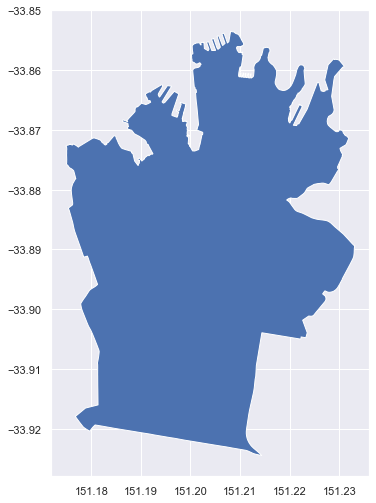

In [6]:
district.plot()

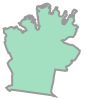

In [7]:
district_polygon = district['geometry'].values[0]
district_polygon

In [8]:
sql = f"""
SELECT *
FROM districts 
WHERE ST_Intersects(districts.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326));
"""

districts = gpd.read_postgis(sql, engine, geom_col='geometry')
print(districts.shape)
districts.head()

(39, 13)


,lc_ply_pid,dt_create,dt_retire,loc_pid,nsw_locali,nsw_loca_1,nsw_loca_2,nsw_loca_3,nsw_loca_4,nsw_loca_5,nsw_loca_6,nsw_loca_7,geometry
0,24908,2015-09-03,None,NSW887,2015-11-10,None,CENTENNIAL PARK,None,None,G,None,1,"POLYGON ((151.23414 -33.88984, 151.23524 -33.8..."
1,14765,2011-05-17,None,NSW4555,2008-09-11,None,ZETLAND,None,None,G,None,1,"POLYGON ((151.20953 -33.90370, 151.20968 -33.9..."
2,29986,2019-05-29,None,NSW1412,2017-05-02,None,ELIZABETH BAY,None,None,G,None,1,"POLYGON ((151.22752 -33.86809, 151.22751 -33.8..."
3,29987,2019-05-29,None,NSW3282,2012-10-30,None,POTTS POINT,None,None,G,None,1,"POLYGON ((151.22987 -33.85812, 151.22991 -33.8..."
4,26621,2016-09-12,None,NSW3475,2016-11-11,None,RUSHCUTTERS BAY,None,None,G,None,1,"POLYGON ((151.22892 -33.87227, 151.22900 -33.8..."


In [9]:
districts['coords'] = districts['geometry'].apply(lambda x: x.representative_point().coords[:])
districts['coords'] = [coords[0] for coords in districts['coords']]

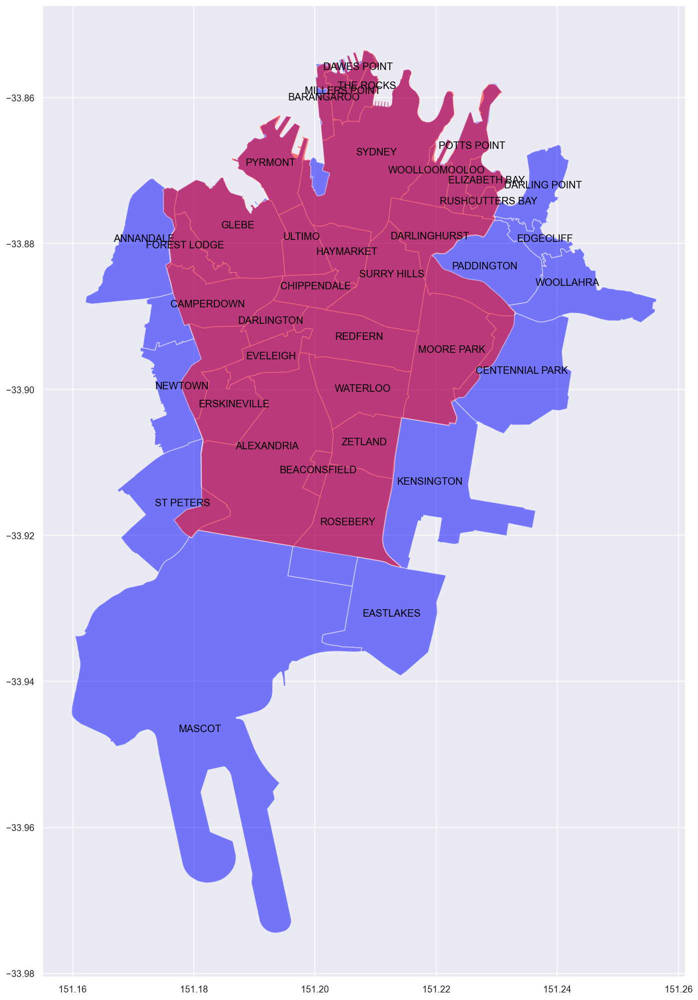

In [10]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=120)
ax = districts.plot(ax=ax, alpha=0.5, color='blue')
ax = district.plot(alpha=0.5, ax=ax, color='red')

for idx, row in districts.iterrows():
    plt.annotate(text=row['nsw_loca_2'], xy=row['coords'], horizontalalignment='center', color='black')

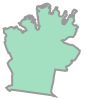

In [11]:
district_polygon = district['geometry'].values[0]
district_polygon

In [12]:
js = district.to_json()
js = geojson.loads(js)

## Query 1: Intersection

In [90]:
test_set_sizes = [100, 1000, 10000, 100000, 500000]

### PostGIS

`ST_Intersects()`

```sql
SELECT *
FROM roads
WHERE ST_Intersects(roads.geometry, ST_GeometryFromText(text WKT, SRID));
```

Example: `ST_GeomFromText('POINT(-126.4 45.32)', 312)`

In [91]:
%%time
sql = f"""
SELECT *
FROM roads as roads
WHERE ST_Intersects(roads.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326));
"""
df = gpd.read_postgis(sql, engine, geom_col='geometry')
print(df.shape)
df.head()

(10201, 11)
CPU times: user 208 ms, sys: 25.8 ms, total: 234 ms
Wall time: 960 ms


,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,1884057,5114,secondary,Park Street,None,B,40,0,F,F,"LINESTRING (151.20813 -33.87312, 151.20805 -33..."
1,2077098,5153,footway,None,None,B,0,0,F,F,"LINESTRING (151.21720 -33.86053, 151.21709 -33..."
2,1954876,5113,primary,Cleveland Street,None,F,50,0,F,F,"LINESTRING (151.19310 -33.88761, 151.19325 -33..."
3,2077099,5153,footway,None,None,B,0,0,F,F,"LINESTRING (151.21580 -33.86336, 151.21568 -33..."
4,2077101,5153,footway,None,None,B,0,0,F,F,"LINESTRING (151.21529 -33.86346, 151.21528 -33..."


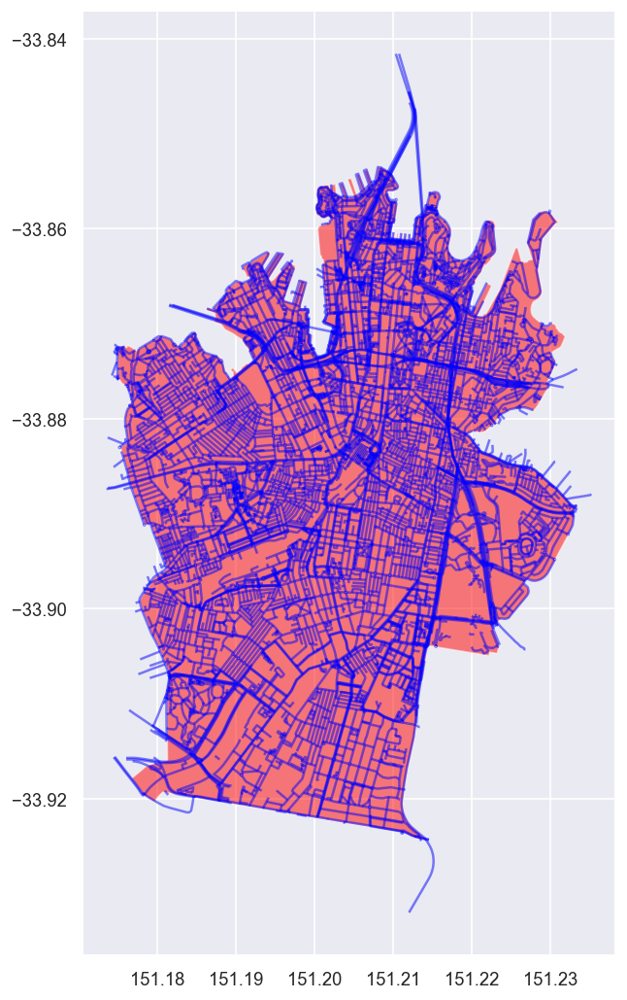

In [92]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=120)
ax = district.plot(alpha=0.5, ax=ax, color='red')
ax = df.plot(ax=ax, alpha=0.5, color='blue')

In [93]:
data = []

for n in test_set_sizes:
    n_str = str(n)
  
    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
        
    table_name = f'roads_sydney_{n_str}'
    
    sql = f"""
        SELECT *
        FROM {table_name} as roads
        WHERE ST_Intersects(roads.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326));
    """
    
    for i in range(50):
        start = time()
        roads = gpd.read_postgis(sql, engine, geom_col='geometry')
        end = time()
        data += (n, (end - start) * 1000),

    print(table_name, 'done. Shape: ', roads.shape)

roads_sydney_100 done. Shape:  (4, 12)
roads_sydney_1k done. Shape:  (17, 12)
roads_sydney_10k done. Shape:  (213, 12)
roads_sydney_100k done. Shape:  (2153, 12)
roads_sydney_500k done. Shape:  (10792, 12)


In [94]:
df = pd.DataFrame(data, columns=['n', 'time in milliseconds'])

<AxesSubplot:title={'center':'ST_Intersects runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

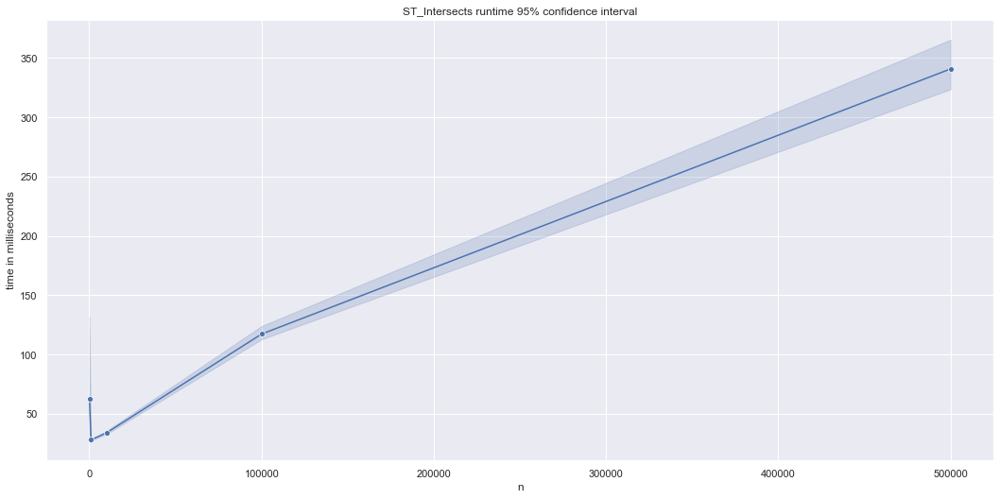

In [95]:
plt.title('ST_Intersects runtime 95% confidence interval')
sns.lineplot(data=df, x='n', y='time in milliseconds', marker='o')

In [96]:
all_runtime = df.copy()
all_runtime['system'] = 'PostGIS'

### MongoDB

In [97]:
%%time
cursor = db['roads_sydney_500k'].find(
    {
        'geometry': {
            '$geoIntersects': {'$geometry': js['features'][0]['geometry']}
        }
    }
)
print(len([item for item in cursor]), 'documents')
stats = cursor.explain()
time_in_ms = stats['executionStats']['executionTimeMillis']
print(time_in_ms, 'ms')

10781 documents
4174 ms
CPU times: user 102 ms, sys: 7.48 ms, total: 110 ms
Wall time: 8.58 s


In [98]:
stats['executionStats']['executionTimeMillis']

4174

In [99]:
data = []

for n in test_set_sizes:
    n_str = str(n)

    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
        
    table_name = f'roads_sydney_{n_str}'
    logic = {
        'geometry': {
            '$geoIntersects': {
                '$geometry': js['features'][0]['geometry']
            }
        }
    }
    
    for i in range(50):
        cursor = db[table_name].find(logic)
        stats = cursor.explain()
        time_in_ms = stats['executionStats']['executionTimeMillis']
        data += (n, time_in_ms),

    print(table_name, 'done. Matched records: ', len([item for item in cursor]))

roads_sydney_100 done. Matched records:  4
roads_sydney_1k done. Matched records:  17
roads_sydney_10k done. Matched records:  213
roads_sydney_100k done. Matched records:  2145
roads_sydney_500k done. Matched records:  10781


In [100]:
df = pd.DataFrame(data, columns=['n', 'time in milliseconds'])
df['system'] = 'MongoDB'

<AxesSubplot:title={'center':'$geoIntersects runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

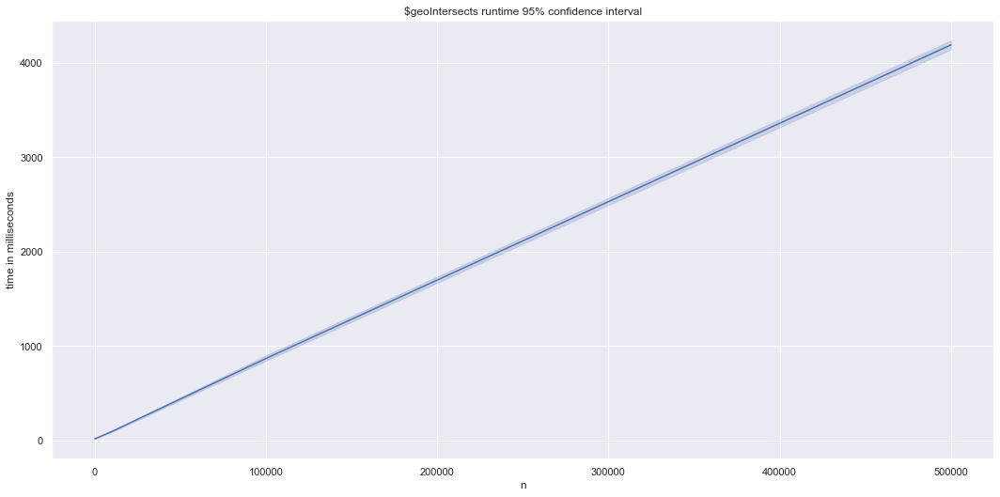

In [101]:
plt.title('$geoIntersects runtime 95% confidence interval')
sns.lineplot(data=df, x='n', y='time in milliseconds', markers='o')

### Query 1 Result

In [102]:
all_runtime = pd.concat([all_runtime, df])

<AxesSubplot:title={'center':'Intersects() runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

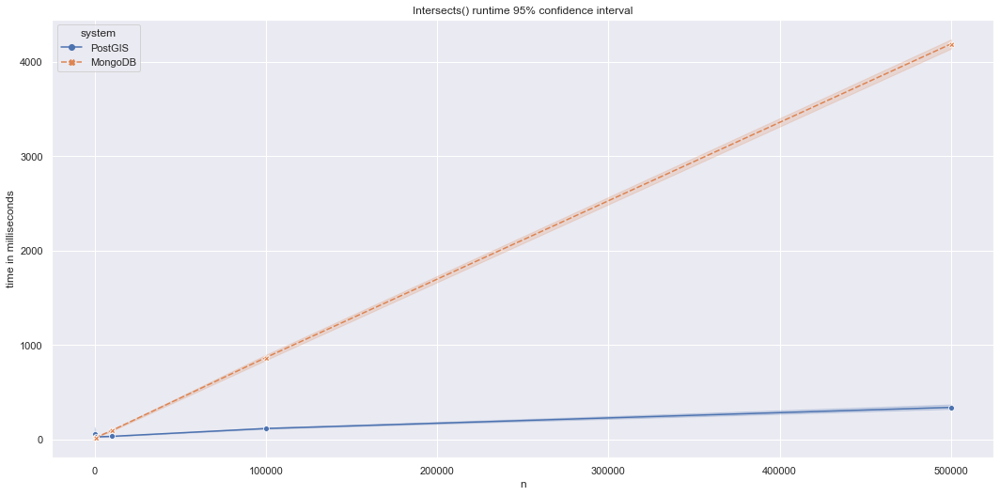

In [103]:
plt.title('Intersects() runtime 95% confidence interval')
sns.lineplot(data=all_runtime, x='n', y='time in milliseconds', hue='system', style='system', markers=True)

In [104]:
grouped = all_runtime.groupby(['system', 'n']).agg(['mean', 'std'])
grouped = grouped.unstack(0)
grouped = grouped.iloc[:, [1, 3, 0, 2]]
grouped = grouped.swaplevel(axis=1)
grouped

time in milliseconds                                 
system              PostGIS              MongoDB            
                       mean         std     mean         std
n                                                           
100               62.928119  243.394148    19.06    3.610698
1000              28.010716    2.126545    23.92    3.874775
10000             33.940363    4.738130    95.10   20.966689
100000           117.231469   23.035712   868.54  102.000442
500000           340.879350   84.550996  4190.28  178.446246

In [105]:
# how to query hierarchical index columns
# grouped.loc[:, grouped.columns.get_level_values(1) == 'mean']
# grouped.loc[:, (grouped.columns.get_level_values(1) == 'mean') & (grouped.columns.get_level_values(2) == 'MongoDB')]

In [106]:
df = grouped.copy()
df.columns = ['PostGIS_mean', 'PostGIS_std', 'MongoDB_mean', 'MongoDB_std']
df

,PostGIS_mean,PostGIS_std,MongoDB_mean,MongoDB_std
n,,,,
100,62.928119,243.394148,19.06,3.610698
1000,28.010716,2.126545,23.92,3.874775
10000,33.940363,4.738130,95.10,20.966689
100000,117.231469,23.035712,868.54,102.000442
500000,340.879350,84.550996,4190.28,178.446246


In [107]:
# prevent zero division if 0
for col in ['MongoDB_mean', 'MongoDB_std']:
    df.loc[df[col] == 0, col] = 0.0001

In [108]:
fig = px.line(df.reset_index(), x='n', y=['MongoDB_mean', 'PostGIS_mean'], 
              log_x=True, log_y=True, height=600, width=1000, 
              labels={'value': 'time in milliseconds', 'MongoDB_mean': 'MongoDB', 'PostGIS_mean': 'PostGIS'},
              title='Intersects() Runtime Comparison between PostGIS and MongoDB')

for data in fig.data:
    data.update(mode='markers+lines')
fig

In [109]:
fig = px.line(df.reset_index(), x='n', y=['MongoDB_mean', 'PostGIS_mean'], 
              log_x=False, log_y=False, height=600, width=1000, 
              labels={'value': 'time in milliseconds', 'MongoDB_mean': 'MongoDB', 'PostGIS_mean': 'PostGIS'},
              title='Intersects() Runtime Comparison between PostGIS and MongoDB')

for data in fig.data:
    data.update(mode='markers+lines')
fig

## Query 2: Within

In [110]:
test_set_sizes = [100, 1000, 10000, 100000, 1000000]

### PostGIS

`ST_Within()`

```sql
SELECT *
FROM a
WHERE ST_Within(a.geometry, b.geometry);
-- Evaluates to True if a is inside of b
```

In [111]:
%%time
sql = f"""
SELECT *
FROM airbnb
WHERE ST_Within(airbnb.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326));
"""
df = gpd.read_postgis(sql, engine, geom_col='geometry')
print(df.shape)
df.head(1)

(9243, 97)
CPU times: user 514 ms, sys: 58 ms, total: 573 ms
Wall time: 3.24 s


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,geometry
0,310414,https://www.airbnb.com/rooms/310414,20181207034750,2018-12-07,Relax on the Terrace of a Darlinghurst Home,Soak up the sunshine on a lounger at this inne...,Welcome to Sydney! This quirky terrace house h...,Soak up the sunshine on a lounger at this inne...,none,"Victoria Street, Stanley Street, and Crown Str...",...,None,None,f,f,strict_14_with_grace_period,f,f,1,1.24,POINT (151.21766 -33.88191)


In [112]:
df.iloc[:1, 20:40]

,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed
0,https://www.airbnb.com/users/show/1596677,David,2012-01-11,"Darlinghurst, New South Wales, Australia","Inner city Sydney guy, loves to travel, but ha...",None,None,None,t,https://a0.muscache.com/im/users/1596677/profi...,https://a0.muscache.com/im/users/1596677/profi...,Paddington,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t,t,"Darlinghurst, NSW, Australia",Paddington,Sydney


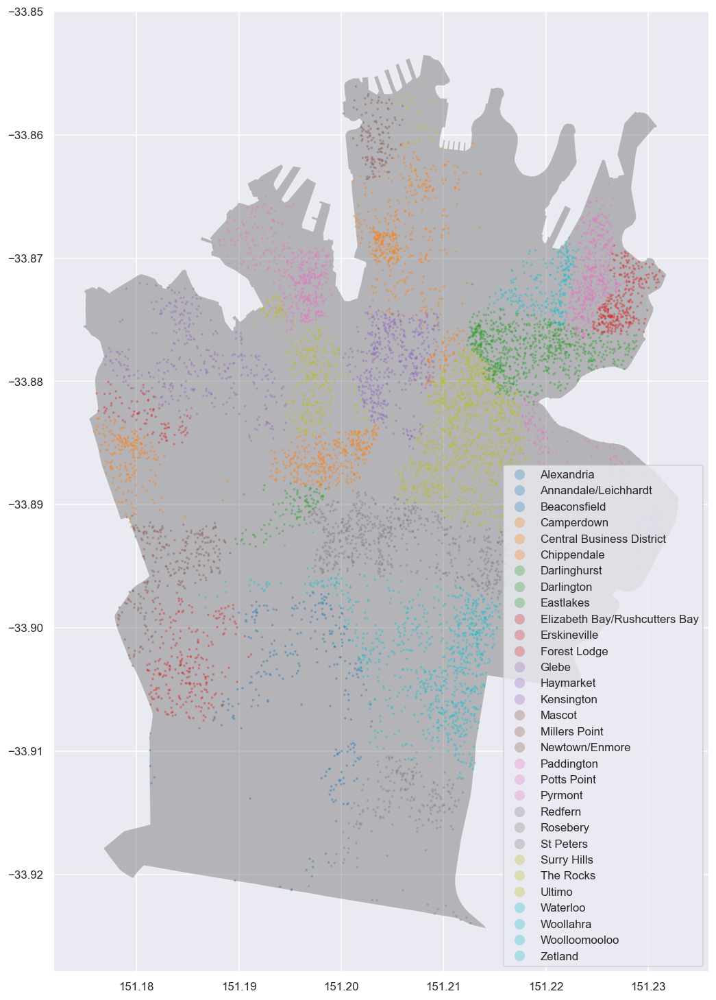

In [113]:
fig, ax = plt.subplots(figsize=(10, 20), dpi=110)
ax = district.plot(alpha=0.5, ax=ax, color='grey')
ax = df.plot('neighbourhood', ax=ax, alpha=0.3, markersize=2, legend=True)

In [114]:
data = []

for n in test_set_sizes:
    n_str = str(n)
  
    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
        
    table_name = f'airbnb_sydney_{n_str}'
    
    sql = f"""
        SELECT *
        FROM {table_name} as airbnb
        WHERE ST_Within(airbnb.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326));
    """
    
    for i in range(50):
        start = time()
        listings = gpd.read_postgis(sql, engine, geom_col='geometry')
        end = time()
        data += (n, (end - start) * 1000),

    print(table_name, 'done. Shape: ', listings.shape)

airbnb_sydney_100 done. Shape:  (32, 19)
airbnb_sydney_1k done. Shape:  (253, 19)
airbnb_sydney_10k done. Shape:  (2460, 19)
airbnb_sydney_100k done. Shape:  (24837, 19)
airbnb_sydney_1m done. Shape:  (247129, 19)


In [115]:
df = pd.DataFrame(data, columns=['n', 'time in milliseconds'])

<AxesSubplot:title={'center':'ST_Within runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

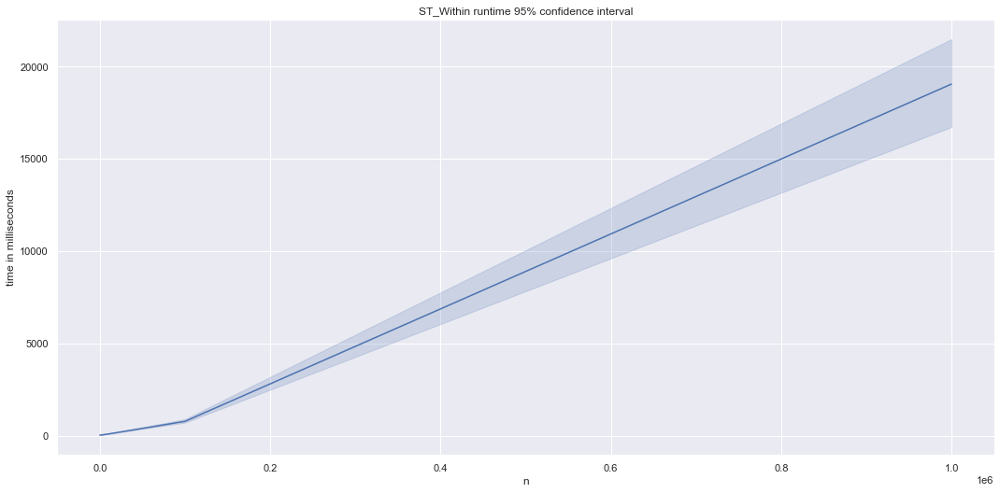

In [116]:
plt.title('ST_Within runtime 95% confidence interval')
sns.lineplot(data=df, x='n', y='time in milliseconds', markers='o')

In [117]:
all_runtime = df.copy()
all_runtime['system'] = 'PostGIS'

### MongoDB

In [118]:
%%time
cursor = db['airbnb_sydney_1m'].find(
    {
        'geometry': {
            '$geoWithin': {'$geometry': js['features'][0]['geometry']}
        }
    }
)
print(len([item for item in cursor]), 'documents')
stats = cursor.explain()
time_in_ms = stats['executionStats']['executionTimeMillis']
print(time_in_ms)

247276 documents
12285
CPU times: user 3.13 s, sys: 504 ms, total: 3.63 s
Wall time: 36.2 s


In [119]:
data = []

for n in test_set_sizes:
    n_str = str(n)
  
    if n >= 1000000:
        n_str = n_str[:-6] + 'm'
    elif n > 100:
        n_str = n_str[:-3] + 'k'
        
    table_name = f'airbnb_sydney_{n_str}'
    logic = {
        'geometry': {
            '$geoWithin': {
                '$geometry': js['features'][0]['geometry']
            }
        }
    }
    
    for i in range(50):
        cursor = db[table_name].find(logic)
        stats = cursor.explain()
        time_in_ms = stats['executionStats']['executionTimeMillis']
        data += (n, time_in_ms),

    print(table_name, 'done. Matched records: ', len([item for item in cursor]))

airbnb_sydney_100 done. Matched records:  32
airbnb_sydney_1k done. Matched records:  253
airbnb_sydney_10k done. Matched records:  2460
airbnb_sydney_100k done. Matched records:  24837
airbnb_sydney_1m done. Matched records:  247276


In [120]:
df = pd.DataFrame(data, columns=['n', 'time in milliseconds'])
df['system'] = 'MongoDB'

<AxesSubplot:title={'center':'$geoWithin runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

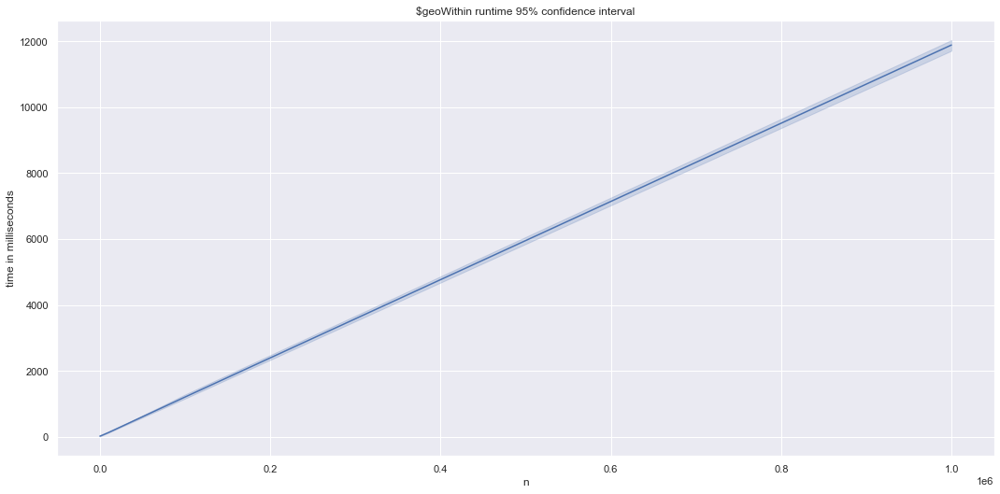

In [121]:
plt.title('$geoWithin runtime 95% confidence interval')
sns.lineplot(data=df, x='n', y='time in milliseconds', markers='o')

### Query 2 Result

In [122]:
all_runtime = pd.concat([all_runtime, df])

<AxesSubplot:title={'center':'Within() runtime 95% confidence interval'}, xlabel='n', ylabel='time in milliseconds'>

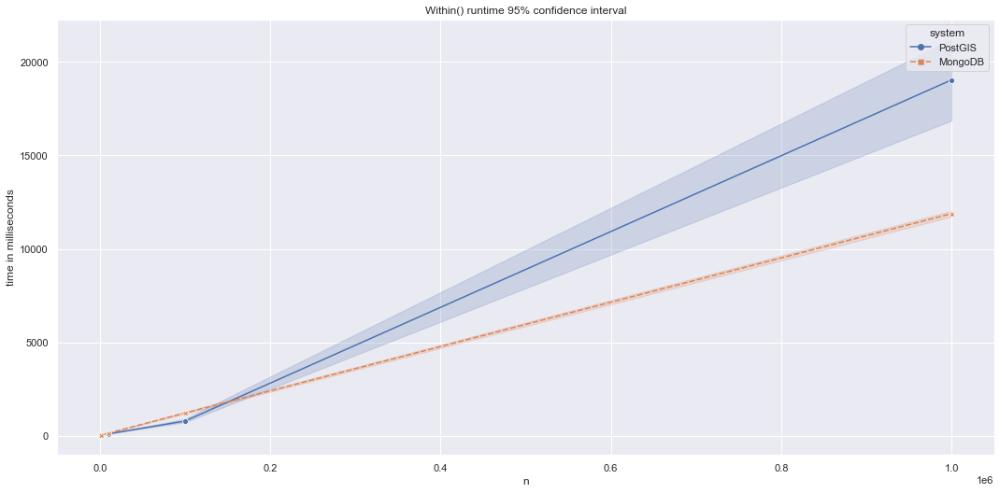

In [123]:
plt.title('Within() runtime 95% confidence interval')
sns.lineplot(data=all_runtime, x='n', y='time in milliseconds', hue='system', style='system', markers=True)

In [124]:
grouped = all_runtime.groupby(['system', 'n']).agg(['mean', 'std'])
grouped = grouped.unstack(0)
grouped = grouped.iloc[:, [1, 3, 0, 2]]
grouped = grouped.swaplevel(axis=1)
grouped

time in milliseconds                                   
system               PostGIS                MongoDB            
                        mean          std      mean         std
n                                                              
100                32.135520    25.391697     23.34    5.464580
1000               34.772711     3.148686     31.22    5.211017
10000              94.435654    18.063386    130.86   25.417341
100000            777.237959   404.579722   1209.02  222.682027
1000000         19041.638761  8235.859486  11886.60  573.270780

In [125]:
# how to query hierarchical index columns
# grouped.loc[:, grouped.columns.get_level_values(1) == 'mean']
# grouped.loc[:, (grouped.columns.get_level_values(1) == 'mean') & (grouped.columns.get_level_values(2) == 'MongoDB')]

In [126]:
df = grouped.copy()
df.columns = ['PostGIS_mean', 'PostGIS_std', 'MongoDB_mean', 'MongoDB_std']
df

,PostGIS_mean,PostGIS_std,MongoDB_mean,MongoDB_std
n,,,,
100,32.135520,25.391697,23.34,5.464580
1000,34.772711,3.148686,31.22,5.211017
10000,94.435654,18.063386,130.86,25.417341
100000,777.237959,404.579722,1209.02,222.682027
1000000,19041.638761,8235.859486,11886.60,573.270780


In [127]:
# prevent zero division if 0
for col in ['MongoDB_mean', 'MongoDB_std']:
    df.loc[df[col] == 0, col] = 0.0001

In [128]:
fig = px.line(df.reset_index(), x='n', y=['MongoDB_mean', 'PostGIS_mean'], 
              log_x=True, log_y=True, height=600, width=1000, 
              labels={'value': 'time in seconds', 'MongoDB_mean': 'MongoDB', 'PostGIS_mean': 'PostGIS'},
              title='Within() Runtime Comparison between PostGIS and MongoDB')

for data in fig.data:
    data.update(mode='markers+lines')
fig

In [129]:
fig = px.line(df.reset_index(), x='n', y=['MongoDB_mean', 'PostGIS_mean'], 
              log_x=False, log_y=False, height=600, width=1000, 
              labels={'value': 'time in seconds', 'MongoDB_mean': 'MongoDB', 'PostGIS_mean': 'PostGIS'},
              title='Within() Runtime Comparison between PostGIS and MongoDB')

for data in fig.data:
    data.update(mode='markers+lines')
fig

# ST_Relates

## Cross intersection

In [ ]:
%%time
sql = f"""
    -- convert polygon to circle where centroid is Chippendale and radius is 10km
    WITH geo_filter AS (
        SELECT ST_Transform(ST_Buffer(ST_Centroid(ST_Transform(geometry, 3857)), 10000), 4326) 
        FROM districts
        WHERE nsw_loca_2 = 'CHIPPENDALE'
    ),
    roads_subset AS (
        SELECT DISTINCT *
        FROM roads
        WHERE ST_Intersects(roads.geometry, (SELECT geometry FROM geo_filter))
    )
    SELECT r1.osm_id AS r1_osm_id
        , r1.fclass AS r1_fclass
        , r1.name AS r1_name
        , r1.geometry AS r1_geometry
        , r2.osm_id AS r2_osm_id
        , r2.fclass AS r2_fclass
        , r2.name AS r2_name
        , ST_AsText(r2.geometry) AS r2_geometry
    FROM roads_subset AS r1
    JOIN roads_subset AS r2 ON ST_Intersects(r1.geometry, r2.geometry) 
    WHERE ST_Relate(r1.geometry, r2.geometry, '0F1FF0102') 
        AND r1.name > r2.name;
"""

df = gpd.read_postgis(sql, engine, geom_col='r1_geometry')
print(df.shape)
df.head()

In [31]:
%%time
sql = f"""
    WITH roads_subset AS (
        SELECT DISTINCT *
        FROM roads
        WHERE ST_Intersects(roads.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326))
    )
    SELECT r1.osm_id AS r1_osm_id
        , r1.fclass AS r1_fclass
        , r1.name AS r1_name
        , r1.geometry AS r1_geometry
        , r2.osm_id AS r2_osm_id
        , r2.fclass AS r2_fclass
        , r2.name AS r2_name
        , ST_AsText(r2.geometry) AS r2_geometry
    FROM roads_subset AS r1
    JOIN roads_subset AS r2 ON ST_Intersects(r1.geometry, r2.geometry) 
    WHERE ST_Relate(r1.geometry, r2.geometry, 'F010F0102');
"""

df = gpd.read_postgis(sql, engine, geom_col='r1_geometry')
print(df.shape)
df.head()

(6, 8)
CPU times: user 29.7 ms, sys: 3.81 ms, total: 33.5 ms
Wall time: 44.6 s


,r1_osm_id,r1_fclass,r1_name,r1_geometry,r2_osm_id,r2_fclass,r2_name,r2_geometry
0,143528258,footway,None,"LINESTRING (151.21274 -33.87361, 151.21275 -33...",2948478,footway,None,"LINESTRING(151.2148659 -33.8701192,151.2148815..."
1,194616057,service,None,"LINESTRING (151.18819 -33.91986, 151.18909 -33...",194616059,service,None,"LINESTRING(151.1890405 -33.9201711,151.1881568..."
2,194616059,service,None,"LINESTRING (151.18904 -33.92017, 151.18816 -33...",194616057,service,None,"LINESTRING(151.1881929 -33.9198573,151.189086 ..."
3,209795720,service,None,"LINESTRING (151.19407 -33.89044, 151.19422 -33...",209795721,service,None,"LINESTRING(151.194175 -33.8904839,151.1941246 ..."
4,209795721,service,None,"LINESTRING (151.19418 -33.89048, 151.19412 -33...",209795720,service,None,"LINESTRING(151.194066 -33.890444,151.1942206 -..."


In [25]:
df['r1_osm_id'].isin(df['r2_osm_id']).value_counts()

True    8
Name: r1_osm_id, dtype: int64

In [26]:
df1 = df[[col for col in df.columns if col.startswith('r1')]].copy()
df1.rename(columns={'r1_geometry': 'geometry'}, inplace=True)
df2 = df[[col for col in df.columns if col.startswith('r2')]].copy()
df2['r2_geometry'] = df2['r2_geometry'].apply(wkt.loads)
df2.rename(columns={'r2_geometry': 'geometry'}, inplace=True)
df2 = gpd.GeoDataFrame(df2, geometry='geometry')

In [27]:
map1 = KeplerGl()
map1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl()

In [28]:
map1.add_data(df1, name='roads1')

In [29]:
map1.add_data(df2, name='roads2')

In [19]:
map1.save_to_html(file_name='map1.html')

Map saved to map1.html!


## T-intersection

In [20]:
%%time
sql = f"""
    WITH roads AS (
        SELECT *
        FROM roads_sydney_500k AS roads
        WHERE ST_Intersects(roads.geometry, ST_GeometryFromText('{district_polygon.wkt}', 4326))
    )
    SELECT r1.area AS r1_area
        , r1.osm_id AS r1_osm_id
        , r1.fclass AS r1_fclass
        , r1.name AS r1_name
        , r1.geometry AS r1_geometry
        , r2.area AS r2_area
        , r2.osm_id AS r2_osm_id
        , r2.fclass AS r2_fclass
        , r2.name AS r2_name
        , ST_AsText(r2.geometry) AS r2_geometry
    FROM roads AS r1
    JOIN roads AS r2 ON ST_Intersects(r1.geometry, r2.geometry) 
    WHERE ST_Relate(r1.geometry, r2.geometry, 'F010F0102');
"""

df = gpd.read_postgis(sql, engine, geom_col='r1_geometry')
print(df.shape)
df.head()

(8, 10)
CPU times: user 29 ms, sys: 2.75 ms, total: 31.8 ms
Wall time: 52.7 s


,r1_area,r1_osm_id,r1_fclass,r1_name,r1_geometry,r2_area,r2_osm_id,r2_fclass,r2_name,r2_geometry
0,SYDNEY,2948478,footway,None,"LINESTRING (151.21487 -33.87012, 151.21488 -33...",SYDNEY,143528258,footway,None,"LINESTRING(151.2127419 -33.8736134,151.212755 ..."
1,ALEXANDRIA,194616057,service,None,"LINESTRING (151.18819 -33.91986, 151.18909 -33...",ALEXANDRIA,194616059,service,None,"LINESTRING(151.1890405 -33.9201711,151.1881568..."
2,ALEXANDRIA,194616059,service,None,"LINESTRING (151.18904 -33.92017, 151.18816 -33...",ALEXANDRIA,194616057,service,None,"LINESTRING(151.1881929 -33.9198573,151.189086 ..."
3,ALEXANDRIA,194616059,service,None,"LINESTRING (151.18904 -33.92017, 151.18816 -33...",MASCOT,194616057,service,None,"LINESTRING(151.1881929 -33.9198573,151.189086 ..."
4,DARLINGTON,209795720,service,None,"LINESTRING (151.19407 -33.89044, 151.19422 -33...",DARLINGTON,209795721,service,None,"LINESTRING(151.194175 -33.8904839,151.1941246 ..."


In [21]:
df['r1_osm_id'].isin(df['r2_osm_id']).value_counts()

True    8
Name: r1_osm_id, dtype: int64

In [22]:
df1 = df[[col for col in df.columns if col.startswith('r1')]].copy()
df1.rename(columns={'r1_geometry': 'geometry'}, inplace=True)
df2 = df[[col for col in df.columns if col.startswith('r2')]].copy()
df2['r2_geometry'] = df2['r2_geometry'].apply(wkt.loads)
df2.rename(columns={'r2_geometry': 'geometry'}, inplace=True)
df2 = gpd.GeoDataFrame(df2, geometry='geometry')

In [23]:
map2 = KeplerGl()
map2.add_data(df1, name='roads1')
map2.add_data(df2, name='roads2')
map2.save_to_html(file_name='map2.html')

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to map2.html!
